### Consulting Project:
# Helping clients to find the optimal location for their business
#(Case Study Berlin)	

# 1 Libraries
Import libraries

In [ ]:
# Install Libraries
!pip install git+git://github.com/geopandas/geopandas.git
!pip install utm

  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-enrsw5cc
  Running command git clone -q git://github.com/geopandas/geopandas.git /tmp/pip-req-build-enrsw5cc
     |████████████████████████████████| 15.4 MB 38 kB/s 
     |████████████████████████████████| 6.6 MB 49.7 MB/s 
  Created wheel for geopandas: filename=geopandas-0.9.0+54.g64598b6-py2.py3-none-any.whl size=997334 sha256=faecae9306efe88a684635661db389703fbe16432e07904f0805e4e3767069b8
  Stored in directory: /tmp/pip-ephem-wheel-cache-7f7_1l9w/wheels/cf/3e/0b/6475054094c2b1ea054158ac1fdcf749fb92f5b512377e4cf8
Successfully built geopandas
  Created wheel for utm: filename=utm-0.7.0-py3-none-any.whl size=6107 sha256=733b4892290c7170d3fd5dc2b47d51db07c2e30e6e9474a52f3134c81eb7c951
  Stored in directory: /root/.cache/pip/wheels/a5/b0/12/7ee4fdb0f9fbb4157100bd02390436ed5d58ebfd3c6d6a0886
Successfully built utm


In [ ]:
# Import Libraries
import math
import utm
import re
import requests
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.colors as mcolors
matplotlib.style.use('seaborn-whitegrid')
from bs4 import BeautifulSoup
import folium
from folium import plugins
from folium.plugins import HeatMap
import geopy
from geopy.geocoders import Nominatim
from geopy import Nominatim
geolocator = Nominatim(user_agent="berlin_explorer")
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans

# 2 Raw Data
Import Data

In [ ]:
!unrar x Berlin_data.rar


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from Berlin_data.rar

Extracting  Berlin_Venues.pkl                                              2%  OK 
Extracting  LOR-Planungsraeume.geojson                                     8%  OK 
Extracting  neighbourhoods.geojson                                        10%  OK 
Extracting  plz.geojson                                                   15%  OK 
Creating    Berlin_shp                                                OK
Extracting  Berlin_shp/gis_osm_landuse_a_free_1.cpg                       15%  OK 
Extracting  Berlin_shp/gis_osm_landuse_a_free_1.dbf                       16%  OK 
Extracting  Berlin_shp/gis_osm_landuse_a_free_1.prj                       16%  OK 
Extracting  Berlin_shp/gis_osm_landuse_a_free_1.shp                       53% 75%  OK 
Extracting  Berlin_shp/gis_osm_landuse_a_free_1.shx                       75%

## 2.1 Neighbourhoods

In [ ]:
geo_neighbourhoods = gpd.read_file("neighbourhoods.geojson")
geo_neighbourhoods = geo_neighbourhoods.dropna()
geo_neighbourhoods.head()

,neighbourhood,neighbourhood_group,geometry
0,Blankenfelde/Niederschönhausen,Pankow,"MULTIPOLYGON (((13.41191 52.61487, 13.41183 52..."
1,Helmholtzplatz,Pankow,"MULTIPOLYGON (((13.41405 52.54929, 13.41422 52..."
2,Wiesbadener Straße,Charlottenburg-Wilm.,"MULTIPOLYGON (((13.30748 52.46788, 13.30743 52..."
3,Schmöckwitz/Karolinenhof/Rauchfangswerder,Treptow - Köpenick,"MULTIPOLYGON (((13.70973 52.39630, 13.70926 52..."
4,Müggelheim,Treptow - Köpenick,"MULTIPOLYGON (((13.73762 52.40850, 13.73773 52..."


## 2.2 Districts

In [ ]:
districts = gpd.read_file("https://raw.githubusercontent.com/m-hoerz/berlin-shapes/master/berliner-bezirke.geojson")
districts.head()

,gml_id,spatial_name,spatial_alias,spatial_type,geometry
0,re_bezirke.01,01,Mitte,Polygon,"POLYGON ((13.37325 52.50377, 13.37342 52.50399..."
1,re_bezirke.02,02,Friedrichshain-Kreuzberg,Polygon,"POLYGON ((13.44471 52.49422, 13.44498 52.49443..."
2,re_bezirke.03,03,Pankow,Polygon,"POLYGON ((13.44226 52.53097, 13.44561 52.52788..."
3,re_bezirke.04,04,Charlottenburg-Wilmersdorf,Polygon,"POLYGON ((13.30748 52.46788, 13.30833 52.46754..."
4,re_bezirke.05,05,Spandau,Polygon,"POLYGON ((13.21570 52.50936, 13.21570 52.50935..."


## 2.3 Crimes

In [ ]:
crimes = pd.read_csv("Berlin_crimes.csv")
crimes = crimes.query("Year == 2019").drop(labels=['Year'], axis=1)
crimes.head()

,District,Code,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car,From_car,Bike,Burglary,Fire,Arson,Damage,Graffiti,Drugs,Local
1050,Mitte,10111,Tiergarten Süd,60,35,365,92,128,2271,15,198,296,55,13,6,347,77,231,980
1051,Mitte,10112,Regierungsviertel,42,20,554,136,152,3692,13,172,352,22,19,4,497,162,170,1057
1052,Mitte,10113,Alexanderplatz,173,102,1966,500,420,11233,63,587,940,137,43,12,1307,381,1133,3813
1053,Mitte,10114,Brunnenstraße Süd,40,29,268,64,79,1859,39,182,361,64,18,7,424,172,86,902
1054,Mitte,10221,Moabit West,66,29,685,210,202,2107,47,322,326,93,28,15,641,91,618,1409


In [ ]:
to_replace = {'Charlottenburg-Wilmersdorf':'Charlottenburg-Wilm.', 'Steglitz-Zehlendorf':'Steglitz - Zehlendorf',
              'Tempelhof-Schöneberg':'Tempelhof - Schöneberg', 'Treptow-Köpenick':'Treptow - Köpenick',
              'Marzahn-Hellersdorf':'Marzahn - Hellersdorf', }

districts.replace(to_replace=to_replace, inplace=True)
crimes_by_district = districts.merge(crimes, left_on='spatial_alias', right_on='District')
crimes_by_district.head()

,gml_id,spatial_name,spatial_alias,spatial_type,geometry,District,Code,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car,From_car,Bike,Burglary,Fire,Arson,Damage,Graffiti,Drugs,Local
0,re_bezirke.01,01,Mitte,Polygon,"POLYGON ((13.37325 52.50377, 13.37342 52.50399...",Mitte,10111,Tiergarten Süd,60,35,365,92,128,2271,15,198,296,55,13,6,347,77,231,980
1,re_bezirke.01,01,Mitte,Polygon,"POLYGON ((13.37325 52.50377, 13.37342 52.50399...",Mitte,10112,Regierungsviertel,42,20,554,136,152,3692,13,172,352,22,19,4,497,162,170,1057
2,re_bezirke.01,01,Mitte,Polygon,"POLYGON ((13.37325 52.50377, 13.37342 52.50399...",Mitte,10113,Alexanderplatz,173,102,1966,500,420,11233,63,587,940,137,43,12,1307,381,1133,3813
3,re_bezirke.01,01,Mitte,Polygon,"POLYGON ((13.37325 52.50377, 13.37342 52.50399...",Mitte,10114,Brunnenstraße Süd,40,29,268,64,79,1859,39,182,361,64,18,7,424,172,86,902
4,re_bezirke.01,01,Mitte,Polygon,"POLYGON ((13.37325 52.50377, 13.37342 52.50399...",Mitte,10221,Moabit West,66,29,685,210,202,2107,47,322,326,93,28,15,641,91,618,1409


In [ ]:
crimes = pd.read_csv("Berlin_crimes.csv")
crimes = crimes.query("Year == 2019").drop(labels=['Year', 'Code'], axis=1)
crimes = crimes.groupby('Location', as_index=False).sum()
crimes['total_crimes'] = crimes.sum(axis=1)
crimes = crimes.sort_values(by='total_crimes', ascending=False, ignore_index=True)
crimes.head()

,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car,From_car,Bike,Burglary,Fire,Arson,Damage,Graffiti,Drugs,Local,total_crimes
0,Alexanderplatz,173,102,1966,500,420,11233,63,587,940,137,43,12,1307,381,1133,3813,22810
1,Tempelhofer Vorstadt,119,82,872,283,271,5797,113,525,1182,113,55,23,1320,530,527,2119,13931
2,Frankfurter Allee Süd FK,132,92,972,353,168,4273,48,259,775,68,39,15,1062,335,1322,2606,12519
3,Schöneberg-Nord,125,81,737,206,228,4691,39,383,642,113,32,18,672,233,413,2016,10629
4,Tempelhof,66,27,813,173,325,3816,116,698,407,173,47,19,869,254,287,2128,10218


In [ ]:
to_replace = {'Alt  Treptow':'Alt-Treptow', 'Kölln. Vorstadt/Spindlersf.':'Köllnische Vorstadt/Spindlersfeld',
              'MV 1':'MV 1 - Märkisches Viertel', 'MV 2':'MV 2 - Rollbergsiedlung',
              'Nord 1':'Nord 1 - Frohnau/Hermsdorf', 'Nord 2':'Nord 2 - Waidmannslust/Wittenau/Lübars',
              'Ost 1':'Ost 1 - Reginhardstr.', 'Ost 2':'Ost 2 - Alt-Reinickendorf',
              'West 1':'West 1 - Tegel-Süd/Flughafensee', 'West 2':'West 2 - Heiligensee/Konradshöhe',
              'West 3':'West 3 - Borsigwalde/Freie Scholle','West 4':'West 4 - Auguste-Viktoria-Allee',
              'West 5':'West 5 - Tegel/Tegeler Forst', 'Brunnenstr. Nord':'Brunnenstraße Nord',
              'Brunnenstr. Süd':'Brunnenstraße Süd', 'Charlottenburg Nord':'Charlottenburg-Nord',
              'Zehlendorf  Nord':'Zehlendorf Nord', 'Zehlendorf  Südwest':'Zehlendorf Südwest',
              'Gatow / Kladow':'Gatow/Kladow', 'nördliche Luisenstadt':'Nördliche Luisenstadt',
              'südliche Luisenstadt':'Südliche Luisenstadt'}

geo_neighbourhoods.replace(to_replace=to_replace, inplace=True)


gdf_by_neig = geo_neighbourhoods.merge(crimes, left_on='neighbourhood', right_on='Location', how='left')
gdf_by_neig.head()

,neighbourhood,neighbourhood_group,geometry,Location,Robbery,Street_robbery,Injury,Agg_assault,Threat,Theft,Car,From_car,Bike,Burglary,Fire,Arson,Damage,Graffiti,Drugs,Local,total_crimes
0,Blankenfelde/Niederschönhausen,Pankow,"MULTIPOLYGON (((13.41191 52.61487, 13.41183 52...",Blankenfelde/Niederschönhausen,7,5,106,14,59,671,31,133,151,62,15,7,208,32,22,336,1859
1,Helmholtzplatz,Pankow,"MULTIPOLYGON (((13.41405 52.54929, 13.41422 52...",Helmholtzplatz,11,8,179,41,52,891,28,60,228,59,8,2,309,132,35,484,2527
2,Wiesbadener Straße,Charlottenburg-Wilm.,"MULTIPOLYGON (((13.30748 52.46788, 13.30743 52...",Wiesbadener Straße,7,6,82,16,30,763,38,99,191,39,7,1,138,18,20,308,1763
3,Schmöckwitz/Karolinenhof/Rauchfangswerder,Treptow - Köpenick,"MULTIPOLYGON (((13.70973 52.39630, 13.70926 52...",Schmöckwitz/Karolinenhof/Rauchfangswerder,3,0,22,3,10,79,9,8,11,0,5,4,16,3,2,42,217
4,Müggelheim,Treptow - Köpenick,"MULTIPOLYGON (((13.73762 52.40850, 13.73773 52...",Müggelheim,1,1,21,7,9,86,4,11,14,5,11,10,48,10,11,53,302


## 2.4 Geo Data

In [ ]:
railways = gpd.read_file("Berlin_shp/gis_osm_railways_free_1.shp")
subway = railways.query("fclass == 'subway'")

transport = gpd.read_file("Berlin_shp/gis_osm_transport_free_1.shp")
railway_station = transport.query("fclass == ['railway_station', 'tram_stop']")

landuse = gpd.read_file("Berlin_shp/gis_osm_landuse_a_free_1.shp")
park = landuse.query("fclass == 'park'")
park = park[~ park.name.isnull()].reset_index(drop = 'index')
park['center_point'] = park.geometry.representative_point()

residential = landuse.query("fclass == 'residential'")
commercial = landuse.query("fclass == ['commercial', 'retail']")

water = gpd.read_file("Berlin_shp/gis_osm_waterways_free_1.shp")
river = water.query("fclass == 'river'")
river = river[~ river.name.isnull()].reset_index(drop = 'index')
river['center_point'] = river.geometry.representative_point()


In [ ]:
river

,osm_id,code,fclass,width,name,geometry,center_point
0,4446691,8101,river,0,Spree,"LINESTRING (13.67624 52.43323, 13.67613 52.433...",POINT (13.65079 52.43907)
1,4629570,8101,river,0,Havel,"LINESTRING (13.08987 52.42098, 13.09030 52.41456)",POINT (13.08987 52.42098)
2,4702266,8101,river,0,Neue Wuhle,"LINESTRING (13.56033 52.56403, 13.56059 52.564...",POINT (13.57289 52.56114)
3,4702374,8101,river,0,Neue Wuhle,"LINESTRING (13.54764 52.56516, 13.54771 52.565...",POINT (13.55303 52.56507)
4,4702375,8101,river,0,Neue Wuhle,"LINESTRING (13.55864 52.56410, 13.56033 52.56403)",POINT (13.56033 52.56403)
...,...,...,...,...,...,...,...
81,788104068,8101,river,0,Dahme,"LINESTRING (13.58734 52.41378, 13.58641 52.414...",POINT (13.58245 52.42221)
82,788104069,8101,river,0,Spree,"LINESTRING (13.49859 52.46996, 13.49680 52.471...",POINT (13.49419 52.48588)
83,795152063,8101,river,0,Spree,"LINESTRING (13.40915 52.51477, 13.40867 52.514...",POINT (13.40867 52.51480)
84,795152064,8101,river,0,Spree,"LINESTRING (13.41283 52.51459, 13.41184 52.514...",POINT (13.41184 52.51454)


In [ ]:
river.geometry[0:2]

0    LINESTRING (13.67624 52.43323, 13.67613 52.433...
1    LINESTRING (13.08987 52.42098, 13.09030 52.41456)
Name: geometry, dtype: geometry

## 2.5 Plot Functions

In [ ]:
# Plot function
def plot(df, col, title='', camp ='Reds'):
  fig, ax = plt.subplots(figsize=(16,11))

  df.plot(ax=ax, column=col, cmap= camp,
                  edgecolor='black', lw=0.5)
  
  vmin = df[col].min()
  vmax = df[col].max()
  sm = plt.cm.ScalarMappable(cmap= camp, norm=plt.Normalize(vmin=vmin, vmax=vmax))
  cbar = fig.colorbar(sm, pad=0.01, shrink=0.65, aspect=50)
  cbar.ax.set_title('Count', family='serif')

  ax.set(aspect=1.3, frame_on=False)
  plt.title(title, color='tab:brown', family='serif', size=18, style='italic', weight='bold')

  #plt.savefig(gdrive_path+"drug_neig_2019.png", dpi=200, bbox_inches='tight')

In [ ]:
# Plot shp function
def plot_shp(df, color, lw, markersize=50, title=''):
  fig, ax = plt.subplots(figsize=(16,11))
  geo_neighbourhoods.plot(ax=ax, column='neighbourhood',
                      cmap='gray', edgecolor='black',
                      alpha =0.2, lw=0.5)
  
  df.plot(ax=ax, color='tab:'+color, edgecolor='k', lw=lw, marker='.', markersize=markersize, alpha =0.8)

  river.plot(ax=ax, color='tab:blue', lw=1)
  ax.set(aspect=1.3, frame_on=False);  
  plt.title(title, color='tab:brown', family='serif', size=18, style='italic', weight='bold')


## 2.6 Heatmap Functions

In [ ]:
def search_venue(df, category):
  search = lambda x:True if category.capitalize() in x else False
  venues = df[df['Venue Category'].apply(search)].reset_index(drop='index')
  venues_lat_long = list(zip(venues['Venue Latitude'], venues['Venue Longitude']))
  return venues_lat_long

def heatmap_venues(data):
  map = folium.Map(location=[52.5200, 13.4050], zoom_start=11)
  boroughs_style = lambda x: {'color': 'black', 'opacity': 0.9, 'fillColor': 'green', 'weight': 0.5}
  folium.GeoJson(
      neighbourhoods.geometry,
      style_function=boroughs_style,
      name='geojson'
      ).add_to(map)
  HeatMap(data).add_to(map) 
  return map

# 5 Building Address Recommender Algorithm

## 2.7 Search Algorithm 

In [ ]:
# Class Point
class Point():
  def __init__(self, x, y):
    self.x = x
    self.y = y

  def xy(self):
    return self.x, self.y

  def distance(self, point):
    return math.sqrt((self.x - point.x)**2 + (self.y - point.y)**2)
  
  def nearestPoint(self, pointsList):
    index = 0
    min_dist = math.inf
    for i in range(len(pointsList)):
      if self.distance(pointsList[i]) < min_dist and self.distance(pointsList[i]) > 0:
        index = i
        min_dist = self.distance(pointsList[i])
    return index, min_dist 
  
  def latlon_to_xy(self):
    lat = self.x
    lon = self.y
    x, y, zone_number, zone_letter = utm.from_latlon(lat, lon)
    return x, y

  def xy_to_latlon(self):
    # UTM Coordinates system for Berlin = 33U 
    lat, lon = utm.to_latlon(self.x, self.y, 33, 'U')
    return lat, lon

  def plot(self, ax, color='k', text=''):
    ax.scatter(self.x, self.y, color=color)
    ax.text(self.x, self.y, text)

# Class Circle
class Circle():
  def __init__(self, center, radius):
    self.center = center
    self.radius = radius

  def isPointInside(self, point):
    if self.center.distance(point) <= self.radius:
      return True
    return False

  def isPointListInside(self, pointList):
    filter = []
    for p in pointList:
      filter.append(self.isPointInside(p))
    return filter

  def nearby(self, pointList):
    count = 0
    for p in pointList:
      if self.isPointInside(p):
        count += 1
    return count
  
  def plot(self, ax, fill=False):
    draw_circle = plt.Circle(self.center.xy(), self.radius, color='r', fill=fill)
    ax.add_patch(draw_circle)
    ax.set_aspect(1)

Distance between P1 and P2 =  6.4031242374328485 Meters


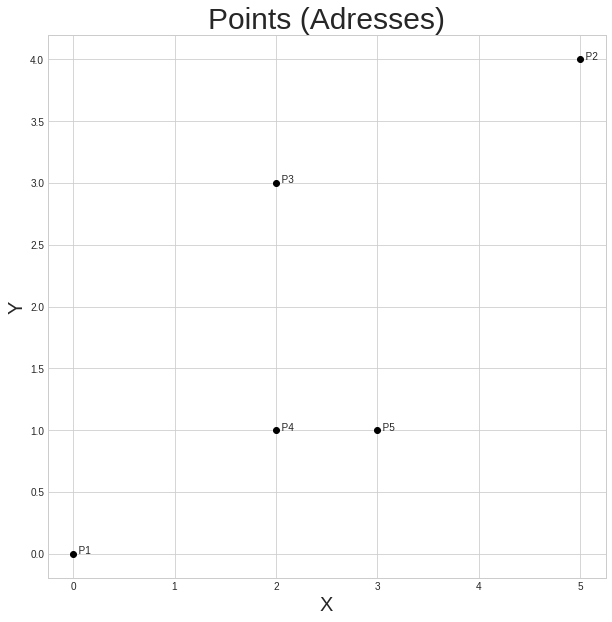

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title('Points (Adresses)', fontsize=30)
plt.xlabel('X', fontsize=20)
plt.ylabel('Y', fontsize=20)

p1 = Point(0,0)
p2 = Point(5,4)
p3 = Point(2,3)
p4 = Point(2,1)
p5 = Point(3,1)

point_list = [p1,p2,p3, p4, p5]

for i, p in enumerate(point_list):
  p.plot(ax, text=f"  P{i+1}")

print("Distance between P1 and P2 = ", p1.distance(p2), "Meters")

Nearby points for this circle is 3 Points


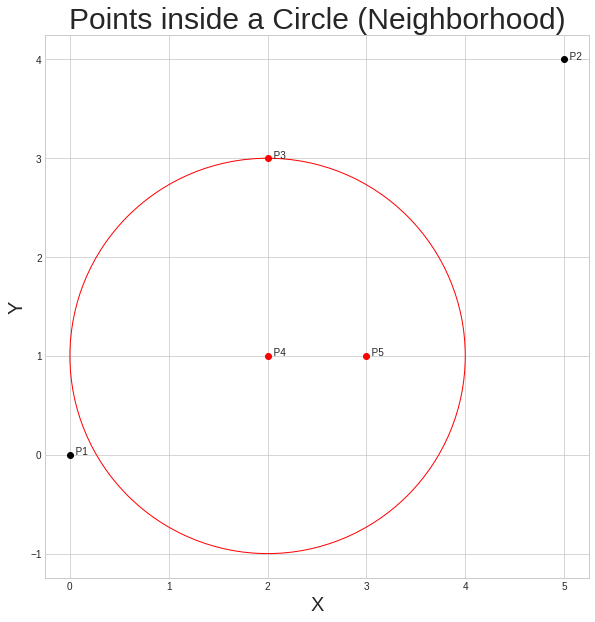

In [ ]:
# Find Points inside a circle
fig, ax = plt.subplots(figsize=(10, 10))
plt.title('Points inside a Circle (Neighborhood)', fontsize=30)
plt.xlabel('X', fontsize=20)
plt.ylabel('Y', fontsize=20)

center = p4
radius = 2
c = Circle(center = center, radius=radius)
c.plot(ax)

for i, p in enumerate(point_list):
  if p.distance(center) <= radius:
    p.plot(ax, text=f"  P{i+1}", color='r')
  else:
    p.plot(ax, text=f"  P{i+1}")

print("Nearby points for this circle is", c.nearby(point_list), "Points")


Nearest Point for P1 is P4, distance = 2.23606797749979
Nearest Point for P2 is P3, distance = 3.1622776601683795
Nearest Point for P3 is P4, distance = 2.0
Nearest Point for P4 is P5, distance = 1.0
Nearest Point for P5 is P4, distance = 1.0


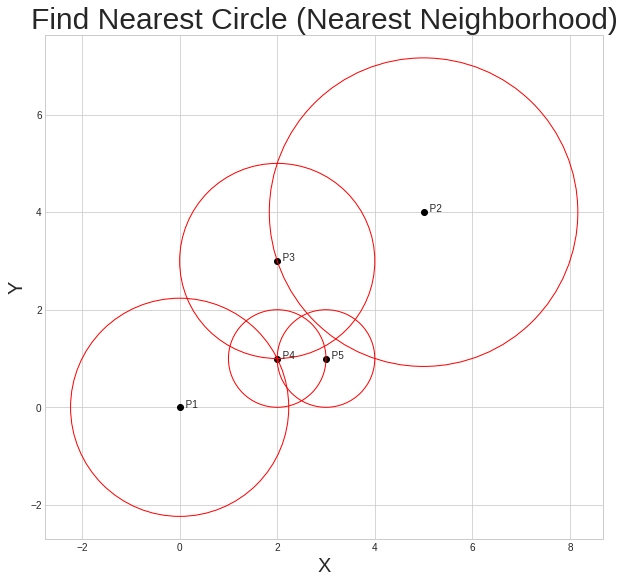

In [ ]:
# Find Points inside a circle
fig, ax = plt.subplots(figsize=(10, 10))
plt.title('Find Nearest Circle (Nearest Neighborhood)', fontsize=30)
plt.xlabel('X', fontsize=20)
plt.ylabel('Y', fontsize=20)

for num, p in enumerate(point_list):
  index, distance = p.nearestPoint(point_list)
  c = Circle(center=p, radius = distance)
  p.plot(ax, text=f"  P{num+1}")
  c.plot(ax)
  print(f"Nearest Point for P{num+1} is P{index+1}, distance = {distance}")

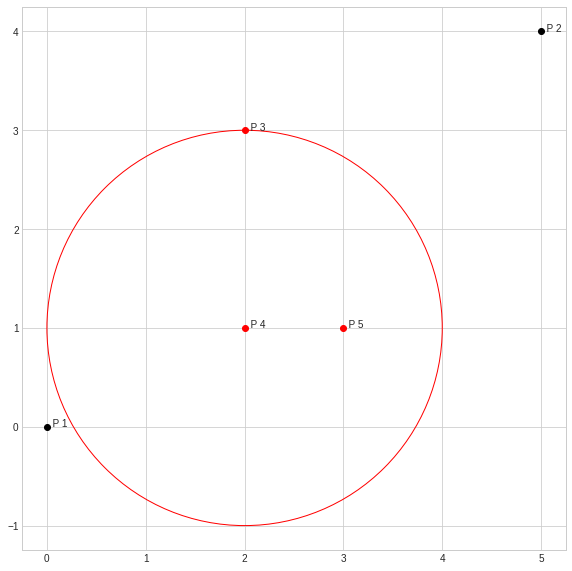

In [ ]:
# Find Points inside a circle
fig, ax = plt.subplots(figsize=(10, 10))

center = p4
radius = 2
c = Circle(center = center, radius=radius)
c.plot(ax)

for i, p in enumerate(point_list):
  if p.distance(center) <= radius:
    p.plot(ax, text=f"  P {i+1}", color='r')
  else:
    p.plot(ax, text=f"  P {i+1}")



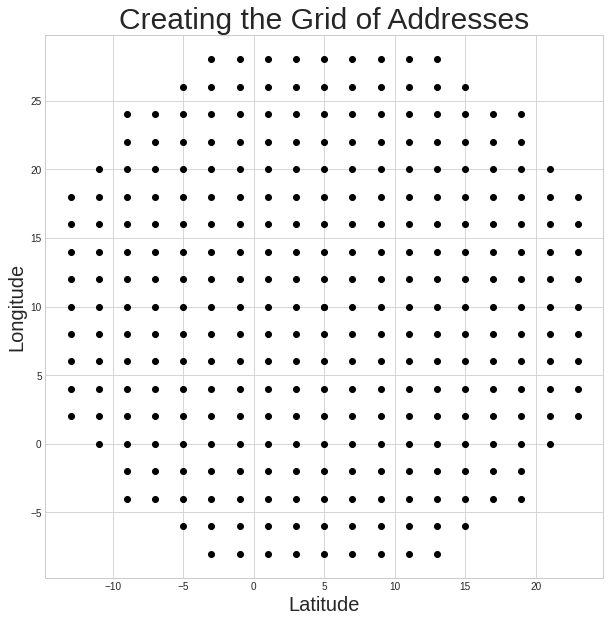

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title('Creating the Grid of Addresses', fontsize=30)
plt.xlabel('Latitude', fontsize=20)
plt.ylabel('Longitude', fontsize=20)

p_list = []
def grid(center=(0,0), radius=20, step=2):
  x,y = center
  center = Point(x,y)
  center.plot(ax)
  radius = radius 
  step = step
  for x in range(-radius, radius, step):
    for y in range(-radius, radius, step):
      p = Point(x+center.x,y+center.y)
      if center.distance(p) < radius:
        p.plot(ax)
        p_list.append(p)
grid(center=(5,10), radius=20, step=2)

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title('Clustering the Grid of Addresses', fontsize=30)
plt.xlabel('Latitude', fontsize=20)
plt.ylabel('Longitude', fontsize=20)

grid(center=(5,10), radius=20, step=2)

clusers_number = 10
data = [[p.x, p.y] for p in p_list]
kmeans = KMeans(n_clusters=clusers_number, random_state=0).fit(data)
cluster_center = kmeans.cluster_centers_

for x,y in cluster_center:
  p = Point(x,y)
  c = Circle(p,radius/2)
  p.plot(ax, color='red')  
  c.plot(ax)

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title('Coloring every Cluster', fontsize=30)
plt.xlabel('Latitude', fontsize=20)
plt.ylabel('Longitude', fontsize=20)
color_list = list(mcolors.TABLEAU_COLORS)

labels = kmeans.labels_

for x,y in cluster_center:
  p = Point(x,y)
  p.plot(ax, color='r')

for point, label in zip(p_list, labels):
  point.plot(ax, color=color_list[label])

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.title('Selecting the best addresses from the Grid', fontsize=30)
plt.xlabel('Latitude', fontsize=20)
plt.ylabel('Longitude', fontsize=20)

for x,y in cluster_center:
  p = Point(x,y)
  p.plot(ax, color='r')  


# 3. Neighborhood Analysis

In [ ]:
#load dataframes
env = pd.read_csv("BER_environmental_justice.csv")
env = env.drop('geometry', axis=1)
neighbourhoods = gpd.read_file('LOR-Planungsraeume.geojson')
neighbourhoods = neighbourhoods.sort_values(by = "Name").reset_index(drop = True)
neighbourhoods['center_point'] = neighbourhoods.geometry.representative_point()
neighbourhoods['Latitude'] = neighbourhoods['center_point'].apply(lambda x:x.y)
neighbourhoods['Longitude'] = neighbourhoods['center_point'].apply(lambda x:x.x)
df = neighbourhoods.merge(env, left_on = 'Name', right_on ='planing_area_name')
df.head()


## 3.1 Demographic Analysis

### 3.1.1 Water Areas

In [ ]:
plot_shp(river, 'blue', lw=2, title='Rivers and  in Berlin')

### 3.1.2 Parks

In [ ]:
plot_shp(park, 'green', lw=0.1, title='Parks in Berlin')

### 3.1.3 Business Area

In [ ]:
plot_shp(commercial, 'red', lw=0.1, title='Commercial and Retail Area')

### 3.1.4 Residential Area

In [ ]:
plot_shp(residential, 'purple', lw=0.1, title='Residential Area in Berlin')
plt.show()

### 3.1.5 Population

In [ ]:
plot(df, 'population', title='population in Berlin')

In [ ]:
df[df['population'] == df['population'].max()]

## 3.2 Accessibility



### 3.2.1 Public Tansport

In [ ]:
plot_shp(railway_station, 'red', lw=0.1, title='Stations in Berlin')

## 3.3 Safty / Criminality

### 3.3.1 Durgs

In [ ]:
plot(gdf_by_neig, 'Drugs', 'Drugs in Berlin')


### 3.3.2 Total Crimes Per capita

In [ ]:
plot(gdf_by_neig, 'total_crimes', 'Total Crimes in Berlin')

## 3.4 Environmental Aspekts

### 3.4.1 Noise

In [ ]:
plot(df, 'Noise', title='Noise in Berlin')

### 3.4.2 Air Pollution

In [ ]:
plot(df, 'Air Pollution (PM2.5 + NO2)', title='Air Pollution (PM2.5 + NO2) in Berlin')

### 3.4.3 Green Area Supply

In [ ]:
plot(df, 'Grean area supply', title='Grean area supply in Berlin', camp='Greens')

### 3.4.4 Bioclimatic Stress

In [ ]:
plot(df, 'Bioclimatic Stress', title='Bioclimatic Stress in Berlin')

### 3.4.5 Social Status

In [ ]:
plot(df, 'Social Status', title='Social Status in Berlin')

## 3.5 Competitive Analysis

In [ ]:
df2 = df.drop(['description', 'altitudeMode', 'tessellate', 'KOORDINATE', 'QUELLEURL', 'BEZ', 'PGR', 'Field_1', 'PLRNAME', 'ERSTELLDAT', 'QUELLE', 'PLR', 'GEBIETSTAN', 'LIZENZ', 'EMAIL', 'IBR', 'BZR'], axis=1)
df2.head()

In [ ]:
# 13500+ Venues in Berlin
berlin_venues = pd.read_pickle('Berlin_Venues.pkl')
berlin_venues.sample(5)

### 3.5.1 Greek Restaurant 

In [ ]:
greek_restaurants = search_venue(berlin_venues, 'Greek')
heatmap_venues(greek_restaurants)

### 3.5.2 Japanese Restaurant 

In [ ]:
japanese_restaurants = search_venue(berlin_venues, 'Japanese')
heatmap_venues(japanese_restaurants)

### 3.5.3 Ice Cream Parlor 

In [ ]:
Ice_lat_long = search_venue(berlin_venues, 'Ice')
heatmap_venues(Ice_lat_long)

### 3.5.4 Irish Pub

In [ ]:
Irish_lat_long = search_venue(berlin_venues, 'Irish')
heatmap_venues(Irish_lat_long)

### 3.5.5 Vegan

In [ ]:
Vegan_lat_long = search_venue(berlin_venues, 'Vegan')
heatmap_venues(Vegan_lat_long)

# 4 Building Recommender System Algorithm

## 4.1 Conver Latitude and Longitude to metric X, Y 

In [ ]:
length = len(df2)
X = []
Y = []
pointsList = [] 

# Convert Latitude and Longitude to metric X,Y coordinates
for i in range(length):
  p = Point(df2['Latitude'][i], df2['Longitude'][i])
  x, y = p.latlon_to_xy()
  p_xy = Point(x,y)
  pointsList.append(p_xy)
  X.append(x)
  Y.append(y)

df2['X'] = X
df2['Y'] = Y

## 4.2 Find the nearest Neighborhood

In [ ]:
# Find the nearest Neighborhood
distance = []
for i in range(length):
  p = Point(df2['X'][i], df2['Y'][i])
  index, min_dist = p.nearestPoint(pointsList)
  distance.append(min_dist)

df2['min_distance'] = distance
df2.head()

,Name,BEZNAME,PGRNAME,BZRNAME,FLAECHE_HA,FID,geometry,center_point,Latitude,Longitude,planing_area_name,Noise,Air Pollution (PM2.5 + NO2),Grean area supply,Bioclimatic Stress,Social Status,population,X,Y,min_distance
0,Adlershof Ost,Treptow-Köpenick,Treptow-Köpenick 2,Adlershof,"346,3835",331,"MULTIPOLYGON (((13.55508 52.42591, 13.55512 52...",POINT (13.54841 52.43844),52.438443,13.548406,Adlershof Ost,3,3,3,3,3,14979.0,401326.460068,5.810796e+06,1224.541665
1,Adlershof West,Treptow-Köpenick,Treptow-Köpenick 2,Adlershof,"261,5015",330,"MULTIPOLYGON (((13.53017 52.44318, 13.52982 52...",POINT (13.53185 52.43410),52.434103,13.531854,Adlershof West,0,3,4,3,0,0.0,400191.620735,5.810336e+06,1224.541665
2,Alexanderplatzviertel,Mitte,Zentrum,Alexanderplatz,"135,9121",11,"MULTIPOLYGON (((13.41799 52.51394, 13.41814 52...",POINT (13.40747 52.52105),52.521048,13.407470,Alexanderplatzviertel,4,4,3,4,3,8107.0,391949.412330,5.820185e+06,929.993438
3,Allende I,Treptow-Köpenick,Treptow-Köpenick 4,Allende-Viertel,"47,9697",343,"MULTIPOLYGON (((13.59338 52.44908, 13.59297 52...",POINT (13.58851 52.44506),52.445055,13.588511,Allende I,3,3,4,3,3,4639.0,404066.855300,5.811477e+06,739.476476
4,Allende II,Treptow-Köpenick,Treptow-Köpenick 4,Allende-Viertel,"61,463",344,"MULTIPOLYGON (((13.59338 52.44908, 13.59348 52...",POINT (13.59923 52.44617),52.446175,13.599234,Allende II,3,3,4,3,3,1562.0,404798.053742,5.811588e+06,692.323968


## 4.3 Draw the Domain for every Neighborhood

In [ ]:
# create map of Frankfurt using latitude and longitude values
map_berlin = folium.Map(location=[52.5, 13.5], zoom_start=11)
boroughs_style = lambda x: {'color': 'red', 'opacity': 0.9, 'fillColor': 'green', 'weight': 0.7}
folium.GeoJson(
      neighbourhoods.geometry,
      style_function=boroughs_style,
      name='geojson'
      ).add_to(map_berlin)


for lat, lon, radius in zip(df2['Latitude'], df2['Longitude'], df2['min_distance']):
    folium.Circle([lat, lon], radius=radius, color='black', fill=False).add_to(map_berlin)

# add markers to map
for point, borough in zip(df2['center_point'],  df2['Name']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [point.y, point.x],
        radius=3,
        popup=label,
        tooltip=borough,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_berlin)  
    
map_berlin

## 4.4 Find the nearby Venues in every Neighborhood

In [ ]:
def nearby_count(df, venues_lat_lon, label):
  pointList = []
  nearby_list = []

  for lat, lon in venues_lat_lon:
    p = Point(lat, lon)
    x, y = p.latlon_to_xy()
    p_xy = Point(x, y)
    pointList.append(p_xy)
  
  for i in range(len(df)):
    center = Point(df['X'][i], df['Y'][i])
    radius = df['min_distance'][i]
    Neigbourhood = Circle(center= center, radius= radius)
    nearby_list.append(Neigbourhood.nearby(pointList))

  df[label] = nearby_list

def transport_lat_lon(q):
   geometry = transport.query(q).reset_index(drop='index').geometry
   lon, lat = geometry.x, geometry.y
   return list(zip(lat, lon))

### Restaurants ###
  # All Restaurants
restaurants = search_venue(berlin_venues, 'Restaurant')
nearby_count(df2, restaurants, 'Total_restaurants')
  # Greek Restaurants
greek_restaurants = search_venue(berlin_venues, 'Greek')
nearby_count(df2, greek_restaurants, 'greek_restaurants')

### Hotels ###
  # All Hotels
Hotels = search_venue(berlin_venues, 'Hotel')
nearby_count(df2, Hotels, 'Hotels')

#### Puplic Transport ###
  # Train an d Metro stops (S-Bahn and U-Bahn)
railway_stations = transport_lat_lon("fclass == 'railway_station' or fclass == 'railway_halt'")
nearby_count(df2, railway_stations, 'Railway_stations')
  # Tram stops
tram_stops = transport_lat_lon("fclass =='tram_stop'")
nearby_count(df2, tram_stops, 'Tram_stops')
  # Bus stops
bus_stops = transport_lat_lon("fclass == 'bus_stop'")
nearby_count(df2, bus_stops, 'Bus_stops')
  # Sum Public Tansport
df2['Total_transport'] = df2['Railway_stations'] + df2['Tram_stops'] + df2['Bus_stops']

### Free Time Activites ###
  # Rivers
rivers = [(p.y, p.x) for p in river.center_point]
nearby_count(df2, rivers, 'has_River')
df2['has_River'] = [r > 0 for r in df2['has_River']]
  # Parks
parks = [(p.y, p.x) for p in park.center_point]
nearby_count(df2, parks, 'Parks')

df2.head()

,Name,BEZNAME,PGRNAME,BZRNAME,FLAECHE_HA,FID,geometry,center_point,Latitude,Longitude,planing_area_name,Noise,Air Pollution (PM2.5 + NO2),Grean area supply,Bioclimatic Stress,Social Status,population,X,Y,min_distance,Total_restaurants,greek_restaurants,Hotels,Railway_stations,Tram_stops,Bus_stops,Total_transport,has_River,Parks
0,Adlershof Ost,Treptow-Köpenick,Treptow-Köpenick 2,Adlershof,"346,3835",331,"MULTIPOLYGON (((13.55508 52.42591, 13.55512 52...",POINT (13.54841 52.43844),52.438443,13.548406,Adlershof Ost,3,3,3,3,3,14979.0,401326.460068,5.810796e+06,1224.541665,6,2,1,1,13,44,58,False,2
1,Adlershof West,Treptow-Köpenick,Treptow-Köpenick 2,Adlershof,"261,5015",330,"MULTIPOLYGON (((13.53017 52.44318, 13.52982 52...",POINT (13.53185 52.43410),52.434103,13.531854,Adlershof West,0,3,4,3,0,0.0,400191.620735,5.810336e+06,1224.541665,8,2,2,1,11,39,51,False,4
2,Alexanderplatzviertel,Mitte,Zentrum,Alexanderplatz,"135,9121",11,"MULTIPOLYGON (((13.41799 52.51394, 13.41814 52...",POINT (13.40747 52.52105),52.521048,13.407470,Alexanderplatzviertel,4,4,3,4,3,8107.0,391949.412330,5.820185e+06,929.993438,42,0,21,9,27,51,87,True,9
3,Allende I,Treptow-Köpenick,Treptow-Köpenick 4,Allende-Viertel,"47,9697",343,"MULTIPOLYGON (((13.59338 52.44908, 13.59297 52...",POINT (13.58851 52.44506),52.445055,13.588511,Allende I,3,3,4,3,3,4639.0,404066.855300,5.811477e+06,739.476476,3,1,0,0,8,21,29,True,2
4,Allende II,Treptow-Köpenick,Treptow-Köpenick 4,Allende-Viertel,"61,463",344,"MULTIPOLYGON (((13.59338 52.44908, 13.59348 52...",POINT (13.59923 52.44617),52.446175,13.599234,Allende II,3,3,4,3,3,1562.0,404798.053742,5.811588e+06,692.323968,2,0,0,0,2,14,16,True,0


In [ ]:
cols = ['Name', 'min_distance', 'population', 'has_River', 'Parks', 'Total_restaurants', 'greek_restaurants',
        'Hotels', 'Railway_stations',	'Tram_stops',	'Bus_stops', 'Noise',	'Air Pollution (PM2.5 + NO2)',
        'Grean area supply',	'Bioclimatic Stress',	'Social Status'	]

df_norm = df2[cols]
# create a scaler object
scaler = MinMaxScaler()
# fit and transform the data
df_norm = df_norm.drop('Name', axis=1)
df_norm2 = pd.DataFrame(scaler.fit_transform(df_norm), columns=df_norm.columns)
weights = {
  "population" : 5,
  "has_River" : 5,
  "Parks" : 5,
  "Total_restaurants": 10,
  "greek_restaurants": -20,
  "Hotels": 10,
  "Railway_stations":5,
  "Tram_stops":3,
  "Bus_stops":2,
  "Noise": -2,
  "Air Pollution (PM2.5 + NO2)": -2,
  "Grean area supply":  2,
  "Bioclimatic Stress": -2,
  "Social Status": 2,
}

df_norm2 =  df_norm2[weights.keys()] * weights.values()
df_norm2['Total_score'] = df_norm2.sum(axis=1)

df_norm2.insert(0,'Name', df2['Name'])
df_norm2.insert(1,'min_distance', df2['min_distance'])
df_norm2 = df_norm2.sort_values(by='Total_score', ascending=False).reset_index(drop='index')
df_norm2.head(10)

,Name,min_distance,population,has_River,Parks,Total_restaurants,greek_restaurants,Hotels,Railway_stations,Tram_stops,Bus_stops,Noise,Air Pollution (PM2.5 + NO2),Grean area supply,Bioclimatic Stress,Social Status,Total_score
0,Charitéviertel,1208.509192,0.728572,5.0,5.000000,8.428571,-0.0,10.000000,5.000000,1.923077,1.007299,-1.5,-1.0,1.5,-2.0,2.0,36.087520
1,Alexanderplatzviertel,929.993438,1.278747,5.0,3.214286,6.000000,-0.0,7.777778,3.214286,2.076923,0.744526,-2.0,-2.0,1.5,-2.0,1.5,26.306545
2,Wannsee,3958.519691,1.466608,5.0,2.857143,2.571429,-0.0,0.740741,1.428571,0.615385,2.000000,-1.5,-0.0,2.0,-0.0,2.0,19.179876
3,Heine-Viertel West,705.778715,0.949241,5.0,2.500000,3.714286,-0.0,6.296296,1.428571,0.000000,0.379562,-2.0,-2.0,1.5,-2.0,1.5,17.267957
4,Hansaviertel,1146.141998,0.884255,5.0,2.142857,5.000000,-0.0,3.703704,1.428571,0.000000,0.788321,-2.0,-2.0,2.0,-2.0,1.5,16.447708
5,Heine-Viertel Ost,764.304677,1.163444,5.0,5.000000,3.285714,-0.0,1.851852,1.071429,0.000000,0.437956,-1.5,-1.0,1.5,-2.0,1.5,16.310395
6,Traveplatz,822.364899,2.747563,0.0,2.500000,8.428571,-0.0,1.111111,1.785714,1.153846,0.218978,-1.5,-1.0,1.0,-2.0,1.5,15.945784
7,Karl-Marx-Allee,929.993438,1.288369,5.0,1.428571,3.857143,-0.0,2.592593,3.214286,1.384615,0.656934,-2.0,-2.0,1.0,-2.0,1.5,15.922511
8,Rahnsdorf/Hessenwinkel,4566.799716,1.400360,5.0,0.714286,1.142857,-0.0,1.111111,0.714286,1.692308,1.094891,-1.0,-0.0,2.0,-0.0,2.0,15.870098
9,Lausitzer Platz,707.216973,2.047541,5.0,3.214286,5.857143,-0.0,1.111111,0.714286,0.000000,0.467153,-1.5,-2.0,1.5,-2.0,1.0,15.411520


In [ ]:
Top_10_neighborhoods = df_norm2[['Name']][:10]
Top_10_neighborhoods = Top_10_neighborhoods.merge(df2, on='Name')
Top_10_neighborhoods.head()

,Name,BEZNAME,PGRNAME,BZRNAME,FLAECHE_HA,FID,geometry,center_point,Latitude,Longitude,planing_area_name,Noise,Air Pollution (PM2.5 + NO2),Grean area supply,Bioclimatic Stress,Social Status,population,X,Y,min_distance,Total_restaurants,greek_restaurants,Hotels,Railway_stations,Tram_stops,Bus_stops,Total_transport,has_River,Parks
0,Charitéviertel,Mitte,Zentrum,Alexanderplatz,"167,6593",9,"MULTIPOLYGON (((13.37686 52.51964, 13.37714 52...",POINT (13.37943 52.52845),52.528454,13.379433,Charitéviertel,3,3,3,4,4,4619.0,390065.761740,5.821051e+06,1208.509192,59,0,27,14,25,69,108,True,14
1,Alexanderplatzviertel,Mitte,Zentrum,Alexanderplatz,"135,9121",11,"MULTIPOLYGON (((13.41799 52.51394, 13.41814 52...",POINT (13.40747 52.52105),52.521048,13.407470,Alexanderplatzviertel,4,4,3,4,3,8107.0,391949.412330,5.820185e+06,929.993438,42,0,21,9,27,51,87,True,9
2,Wannsee,Steglitz-Zehlendorf,Region D,Zehlendorf Südwest,"2364,1898",234,"MULTIPOLYGON (((13.18295 52.42986, 13.17350 52...",POINT (13.13478 52.41987),52.419866,13.134784,Wannsee,3,2,4,2,4,9298.0,373159.078274,5.809375e+06,3958.519691,18,0,2,4,8,137,149,True,8
3,Heine-Viertel West,Mitte,Zentrum,Alexanderplatz,"63,9874",13,"MULTIPOLYGON (((13.40382 52.50809, 13.40404 52...",POINT (13.41062 52.50971),52.509715,13.410616,Heine-Viertel West,4,4,3,4,3,6018.0,392135.091269,5.818920e+06,705.778715,26,0,17,4,0,26,30,True,7
4,Hansaviertel,Mitte,Moabit,Moabit Ost,"53,2681",29,"MULTIPOLYGON (((13.33585 52.51329, 13.33585 52...",POINT (13.34182 52.51789),52.517894,13.341824,Hansaviertel,4,4,4,4,3,5606.0,387487.687367,5.819934e+06,1146.141998,35,0,10,4,0,54,58,True,6


In [ ]:
# create map of Frankfurt using latitude and longitude values
map_berlin = folium.Map(location=[52.5, 13.5], zoom_start=11)
boroughs_style = lambda x: {'color': 'black', 'opacity': 0.5, 'fillColor': 'green', 'weight': 0.7}
folium.GeoJson(
      neighbourhoods.geometry,
      style_function=boroughs_style,
      name='geojson'
      ).add_to(map_berlin)


for lat, lon, radius in zip(Top_10_neighborhoods['Latitude'], Top_10_neighborhoods['Longitude'], Top_10_neighborhoods['min_distance']):
    folium.Circle(
        [lat, lon],
        radius=radius,
        color='black',
        weight = 1,
        fill=True,
        fill_color = 'red',
        fill_opacity=0.3
        ).add_to(map_berlin)

# add markers to map
for point, borough in zip(Top_10_neighborhoods['center_point'],  Top_10_neighborhoods['Name']):
    label = '{} {}'.format(borough, point)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [point.y, point.x],
        radius=3,
        popup=label,
        tooltip=borough,
        color='black',
        fill=True,
        fill_color='red',
        fill_opacity=0.7,
        parse_html=False).add_to(map_berlin)  
    
map_berlin

In [ ]:

roi_latitudes = []
roi_longitudes = []
roi_x = []
roi_y = []
c_list =[]
p_list = []

for center, radius in zip(Top_10_neighborhoods['center_point'], Top_10_neighborhoods['min_distance']):
  roi_center = Point(center.y, center.x)
  center_lat, center_lon = roi_center.latlon_to_xy()
  center_xy = Point(center_lat, center_lon)

  
  
  radius = int(radius)
  step = 300 #meter
  for x in range(-radius, radius, step):
    for y in range(-radius, radius, step):
      p = Point(x + center_xy.x, y + center_xy.y)
      if center_xy.distance(p) < radius:
        c = Circle(center_xy, 250)
        c_list.append(c)
        p_list.append(p)
        roi_x.append(p.x)
        roi_y.append(p.y)
        lat, lon = p.xy_to_latlon()
        roi_latitudes.append(lat)
        roi_longitudes.append(lon)

print(len(roi_latitudes), 'New Street addresses are generated.')

In [ ]:
roi_restaurant_counts = []

restaurants_xy = []
for res in restaurants:
    x, y = Point(res[0], res[1]).latlon_to_xy()
    p = Point(x,y)
    restaurants_xy.append(p)

for c in c_list:
    roi_restaurant_counts.append(c.nearby(restaurants_xy))

# Let's put this into dataframe
df_roi_locations = pd.DataFrame({'Latitude':roi_latitudes,
                                 'Longitude':roi_longitudes,
                                 'X':roi_x,
                                 'Y':roi_y,
                                 'Restaurants nearby':roi_restaurant_counts
                                 })

df_roi_locations = df_roi_locations.sort_values(by='Restaurants nearby', ascending=False).reset_index(drop='index')
df_roi_locations.head(20)

In [ ]:
good_locations = np.array((df_roi_locations['Restaurants nearby'] >= 3 ))
print('Locations with no more than two restaurants nearby:', good_locations.sum())

df_good_locations = df_roi_locations[good_locations]
df_good_locations.head()

In [ ]:
good_latitudes = df_good_locations['Latitude'].values
good_longitudes = df_good_locations['Longitude'].values

good_locations = [[lat, lon] for lat, lon in zip(good_latitudes, good_longitudes)]

map_frankfurt = folium.Map(location=roi_center.xy(), zoom_start=12)
folium.Marker(roi_center.xy()).add_to(map_frankfurt)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_frankfurt)
    folium.Marker([lat, lon]).add_to(map_frankfurt) 
#folium.GeoJson(ffm_geo, style_function=boroughs_style, name='geojson').add_to(map_frankfurt)
map_frankfurt

In [ ]:
map_frankfurt = folium.Map(location=roi_center.xy(), zoom_start=11)
HeatMap(good_locations, radius=25).add_to(map_frankfurt)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_frankfurt)
#folium.GeoJson(ffm_geo, style_function=boroughs_style, name='geojson').add_to(map_frankfurt)
map_frankfurt

In [ ]:
from sklearn.cluster import KMeans


number_of_clusters = 15

good_xys = df_good_locations[['X', 'Y']].values
kmeans = KMeans(n_clusters=number_of_clusters, random_state=0).fit(good_xys)
kmeans.cluster_centers_

cluster_lat_lon = []
recommended_address = []

for x,y in kmeans.cluster_centers_:
  p = Point(x,y)
  lat, lon = p.xy_to_latlon()
  cluster_lat_lon.append((lat, lon))
  location = geolocator.reverse([lat, lon])
  address = location.address
  recommended_address.append(address)

recommended_address

In [ ]:
map_frankfurt = folium.Map(location=roi_center.xy(), zoom_start=11)
folium.Marker(roi_center.xy()).add_to(map_frankfurt)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.Circle([lat, lon], radius=250, color='#00000000', fill=True, fill_color='#0066ff', fill_opacity=0.07).add_to(map_frankfurt)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_frankfurt)
for lat, lon in cluster_lat_lon:
    folium.Circle([lat, lon], radius=500, color='green', fill=False).add_to(map_frankfurt) 
folium.GeoJson(geo_neighbourhoods, style_function=boroughs_style, name='geojson').add_to(map_frankfurt)
map_frankfurt

In [ ]:
map_frankfurt = folium.Map(location=roi_center.xy(), zoom_start=14)
#folium.TileLayer('cartodbpositron').add_to(map_frankfurt)
for lonlat, addr in zip(cluster_lat_lon, recommended_address):
    folium.Marker([lonlat[0], lonlat[1]], popup=addr).add_to(map_frankfurt) 
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.Circle([lat, lon], radius=250, color='blue', weight=0, fill=True, fill_opacity=0.05).add_to(map_frankfurt)
folium.GeoJson(geo_neighbourhoods, style_function=boroughs_style, name='geojson').add_to(map_frankfurt)
map_frankfurt

# 5 Clustring

In [ ]:
# one hot encoding of venue categories
Berlin_onehot = pd.get_dummies(berlin_venues[['Venue Category']], prefix= "", prefix_sep= " ")
# # add District column back to dataframe
Berlin_onehot['District'] = berlin_venues['District']
# move neighborhood column to the first column
fixed_columns = [Berlin_onehot.columns[-1]] + list(Berlin_onehot.columns[:-1])
Berlin_onehot = Berlin_onehot[fixed_columns]
print(Berlin_onehot.shape)
Berlin_onehot.head()

In [ ]:
berlin_grouped = Berlin_onehot.groupby('District').mean().reset_index()
print(berlin_grouped.shape)
berlin_grouped

In [ ]:
num_top_venues = 5

for hood in berlin_grouped['District']:
    print("----"+hood+"----")
    temp = berlin_grouped[berlin_grouped['District'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    
    #first rows is not usefull it has only Neighbourhood and Neighbourhood-name, so drop this row
    temp = temp.iloc[1:]
    temp['freq'] = round(temp['freq'].astype(float),2)# converting into float type and # taking round values
    temp = temp.sort_values('freq', ascending=False).reset_index(drop=True) # sorting the dataframe by 'freq' in decreasing order
    print(temp.head(num_top_venues))
    print('\n')

In [ ]:
def return_most_common_venues(row, num_top_venues):
    row = row.iloc[1:]
    row_sorted = row.sort_values(ascending=False)
    
    return row_sorted.index.values[0:num_top_venues]


num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['District']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
venues_sorted = pd.DataFrame(columns=columns)
venues_sorted['District'] = berlin_grouped['District']

for ind in np.arange(berlin_grouped.shape[0]):
    venues_sorted.iloc[ind, 1:] = return_most_common_venues(berlin_grouped.iloc[ind, :], num_top_venues)

venues_sorted

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors

# I'm considering number of clusters as 5.
k = 5

X = berlin_grouped.drop('District', axis = 1)

# run k-means clustering
kmeans = KMeans(n_clusters = k, random_state=0)
kmeans.fit(X)

In [ ]:
# add clustering labels
venues_sorted['Cluster_Labels']=  kmeans.labels_

berlin_merged = berlin_venues
# merge top venues_sorted with toronto_data
berlin_merged = berlin_merged.join(venues_sorted.set_index('District'), on='District')

berlin_merged.head()

In [ ]:


# create map
map_berlin = folium.Map(location=[52.5, 13.5], zoom_start=11)
boroughs_style = lambda x: {'color': 'red', 'opacity': 0.9, 'fillColor': 'green', 'weight': 0.7}
folium.GeoJson(
      neighbourhoods.geometry,
      style_function=boroughs_style,
      name='geojson'
      ).add_to(map_berlin)


# set color scheme for the clusters
x = np.arange(k)
ys = [i + x + (i*x)**2 for i in range(k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
arr = ['r', 'b', 'k', 'y', 'g']

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(berlin_merged['District Latitude'], berlin_merged['District Longitude'],
                                  berlin_merged['District'], berlin_merged['Cluster_Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color= rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.5).add_to(map_berlin)
       
map_berlin

In [ ]:
cm.rainbow(np.linspace(0, 1, len(ys)))

In [ ]:
berlin_venues[['Venue Category']]

# 4 Results

## 4.1 Restaurants

### 4.1.1 Most Popular Restaurants Categories in Berlin

In [ ]:
search = lambda x:True if 'Restaurant' in x else False
venues = berlin_venues[berlin_venues['Venue Category'].apply(search)].reset_index(drop='index')

plt.figure(figsize=(20, 5))
df = venues.groupby('Venue Category').count().sort_values(by='Venue', ascending=False)['Venue'][:21]
df = df.drop(labels='Restaurant')

df.plot(kind = 'bar', fontsize = 14, color = 'skyblue')
plt.title('Most Popular Restaurants Categories in Berlin', color='k', family='serif', size=20, style='italic')
plt.xlabel('Category', size=16)
plt.show()

### 4.1.2 Districts with most Restaurants

In [ ]:
search = lambda x:True if 'Restaurant' in x else False
venues = berlin_venues[berlin_venues['Venue Category'].apply(search)].reset_index(drop='index')

plt.figure(figsize=(20, 5))
df = venues.groupby('District').count().sort_values(by='Venue', ascending=False)['Venue']
df.plot(kind = 'bar', fontsize = 16, color = 'skyblue')
plt.title('Districts with most Restaurants', color='k', family='serif', size=20, style='italic')
plt.xlabel('District', size=16)
plt.show()

### 4.1.3 Neighborhoods with most Restaurants

In [ ]:
plt.figure(figsize=(20, 5))
df = df2.groupby('Name').sum().sort_values(by='Total_restaurants', ascending=False)['Total_restaurants'][:20]
df.plot(kind = 'bar', fontsize = 16, color = 'skyblue')
plt.title('Neighborhoods with most Restaurants', color='k', family='serif', size=20, style='italic')
plt.xlabel('Neighborhood', size=16)
plt.show()

## 4.2 Hotels

### 4.2.1 Neighborhoods with most Hotels

In [ ]:
plt.figure(figsize=(20, 5))
df = df2.groupby(by ='BEZNAME').sum().sort_values(by='Hotels', ascending=False)['Hotels']
df.plot(kind = 'bar', fontsize = 16, color = 'skyblue')
plt.title('Districts in Berlin with most Hotels', color='k', family='serif', size=20, style='italic')
plt.xlabel('District', size=16)
plt.show()

### 4.2.2 Neighborhoods with most Hotels

In [ ]:
plt.figure(figsize=(20, 5))
df = df2.groupby('Name').sum().sort_values(by='Hotels', ascending=False)['Hotels'][:20]
df.plot(kind = 'bar', fontsize = 16, color = 'skyblue')
plt.title('Neighborhoods in Berlin with most Hotels', color='k', family='serif', size=20, style='italic')
plt.xlabel('Neighborhood', size=16)
plt.show()

## 4.3 Public Transport

### 4.3.1 Districts with most Public Transport

In [ ]:
plt.figure(figsize=(20, 5))
df = df2.groupby(by ='BEZNAME').sum().sort_values(by='Total_transport', ascending=False)['Total_transport']
df.plot(kind = 'bar', fontsize = 16, color = 'skyblue')
plt.title('Districts in Berlin with most Public Transport', color='k', family='serif', size=20, style='italic')
plt.xlabel('District', size=16)
plt.show()

### 4.3.2 Neighborhoods with most Public Transport

In [ ]:
plt.figure(figsize=(20, 5))
df = df2.groupby('Name').sum().sort_values(by='Total_transport', ascending=False)['Total_transport'][:20]
df.plot(kind = 'bar', fontsize = 16, color = 'skyblue')
plt.title('Neighborhoods in Berlin with most Public Transport', color='k', family='serif', size=20, style='italic')
plt.xlabel('Neighborhood', size=16)
plt.show()

## 4.4 Parks

### 4.4.1 Districts with most Parks

In [ ]:
plt.figure(figsize=(20, 5))
df = df2.groupby(by ='BEZNAME').sum().sort_values(by='Parks', ascending=False)['Parks']
df.plot(kind = 'bar', fontsize = 16, color = 'skyblue')
plt.title('Districts in Berlin with most Parks', color='k', family='serif', size=20, style='italic')
plt.xlabel('District', size=16)
plt.show()

### 4.4.2 Neighborhoods with most Parks

In [ ]:
plt.figure(figsize=(20, 5))
df = df2.groupby('Name').sum().sort_values(by='Parks', ascending=False)['Parks'][:20]
df.plot(kind = 'bar', fontsize = 16, color = 'skyblue')
plt.title('Neighborhoods with most Parks', color='k', family='serif', size=20, style='italic')
plt.xlabel('Neighborhood', size=16)
plt.show()

In [ ]:
l1 = [0,1,2,3,4,5]
[i*i for i in l1 if i%2!=0]